### Import Airbnb data of NYC and drop non-numerical columns such as name, host_id, host_name, last_review, neighbourhood.

In [1]:
import pandas as pd
airbnb = pd.read_csv('AB_NYC_2019.csv')

In [2]:
airbnb.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [3]:
airbnb = airbnb.drop(['name', 'host_id', 'host_name', 'last_review', 'neighbourhood'], axis=1)

In [4]:
airbnb.describe()

,id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


### Generate a pie chart showing the distribution of rental units across NYC's 5 Buroughs:

In [5]:
import plotly.express as px
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [6]:
neighbourhood_groups = pd.DataFrame(airbnb['neighbourhood_group'].value_counts())
neighbourhood_groups

,neighbourhood_group
Manhattan,21661
Brooklyn,20104
Queens,5666
Bronx,1091
Staten Island,373


In [7]:
hood_names = []
value_counts = []

for row in neighbourhood_groups.index:
    hood_names.append(row)
    
for row in neighbourhood_groups['neighbourhood_group']:
    value_counts.append(row)
    
pie_chart = px.pie(values = value_counts, names = hood_names)
pie_chart.show()

### Plot a bar chart of the total number of reviews per neighbourhood group

In [8]:
all_sums = pd.DataFrame(airbnb.groupby(['neighbourhood_group']).sum())
all_sums

,id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
neighbourhood_group,,,,,,,,,
Bronx,24803796188,44565.50071,-8.060805e+04,95459,4976,28371,1609.94,2437,180843
Brooklyn,367035792483,817931.96821,-1.486715e+06,2500600,121761,486574,21104.98,45925,2015070
Manhattan,406683958152,883012.01680,-1.602364e+06,4264527,185833,454569,21158.08,277073,2425586
Queens,123263814259,230784.85597,-4.185631e+05,563867,29358,156950,8879.05,23005,818464
Staten Island,8055857451,15147.61383,-2.764147e+04,42825,1802,11541,587.99,865,74480


In [9]:
review_sums = pd.DataFrame(all_sums['number_of_reviews'])
review_sums.reset_index()

,neighbourhood_group,number_of_reviews
0,Bronx,28371
1,Brooklyn,486574
2,Manhattan,454569
3,Queens,156950
4,Staten Island,11541


In [10]:
bar_chart = px.bar(review_sums, labels = ["Bronx", "Brooklyn", "Manhattan", "Queens", "Staten Island"])
bar_chart.show()

### Plot maps of airbnbs throughout New York:

Text(0.5, 1.0, 'AirBnbs in NYC')

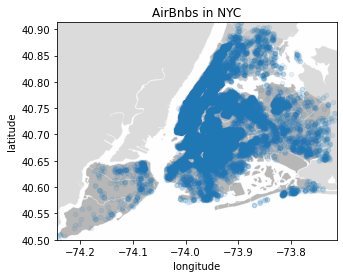

In [11]:
import matplotlib.image as mpimg
nyc_img = mpimg.imread('nyc.png')

airbnb.plot(kind="scatter", x= "longitude", y= "latitude", alpha = 0.1)

plt.imshow(nyc_img, extent = [airbnb['longitude'].min(), airbnb['longitude'].max(), 
                              airbnb['latitude'].min(), airbnb['latitude'].max()], alpha = 0.5)
plt.title("AirBnbs in NYC")


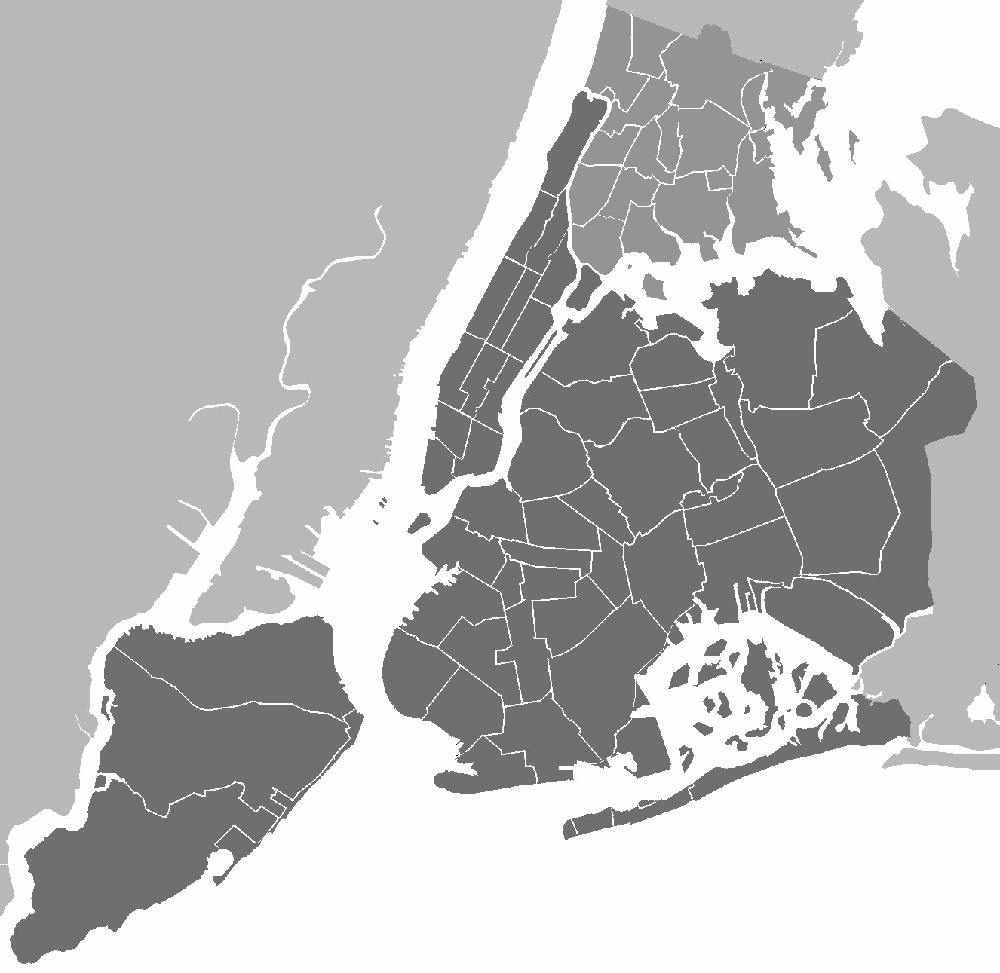

In [12]:
import base64

image_filename = 'nyc.png'
plotly_logo = base64.b64encode(open(image_filename, 'rb').read())

fig = px.scatter(airbnb, x="longitude", y="latitude", color="room_type", size='price', hover_data=['price'])

fig.update_layout(
                images= [dict(
                    source='data:image/png;base64,{}'.format(plotly_logo.decode()),
                    xref="paper", yref="paper",
                    x=0, y=1,
                    sizex=1, sizey=1,
                    xanchor="left",
                    yanchor="top",
                    sizing="stretch",
                    layer="below")])

fig.update_xaxes(range=[-74.2444, -73.713])
fig.update_yaxes(range=[40.4998, 40.9131])

### Plot the average price of room types in Brooklyn who have at least 10 Reviews:

<AxesSubplot:xlabel='room_type'>

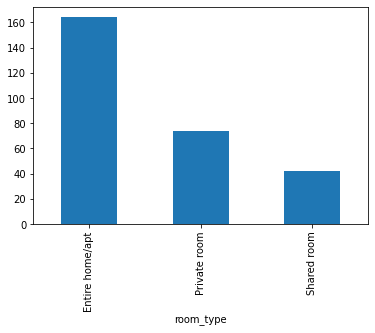

In [13]:
df = pd.DataFrame(airbnb[['neighbourhood_group', 'number_of_reviews', 'room_type', 'price']])


df_filtered = df[ (df['neighbourhood_group'] == "Brooklyn") & (df['number_of_reviews'] >= 10) ].groupby(['room_type']).mean()['price']
pd.DataFrame(df_filtered)

df_filtered.reset_index()

df_filtered.plot(kind = "bar")

### Feature engineering two new categorical binned data:

In [14]:
price_cat = pd.cut(airbnb['price'], bins = 5, labels = [1,2,3,4,5])

price_cat.value_counts()

1    48809
2       54
3       16
4        9
5        7
Name: price, dtype: int64

In [15]:
reviews_cat = pd.cut(airbnb['number_of_reviews'], bins = 5, labels = [1,2,3,4,5])

reviews_cat.value_counts()

1    46869
2     1765
3      210
4       43
5        8
Name: number_of_reviews, dtype: int64

### Data imputation of null values:

In [16]:
airbnb['reviews_per_month'].fillna(airbnb['reviews_per_month'].median(), inplace = True)

airbnb.isna().sum()

id                                0
neighbourhood_group               0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64

### Numeric conversions:

In [17]:
from sklearn.preprocessing import LabelEncoder

labelencoder = LabelEncoder()

airbnb['neighbourhood_group'] = labelencoder.fit_transform(airbnb['neighbourhood_group'])
airbnb['room_type'] = labelencoder.fit_transform(airbnb['room_type'])

airbnb.head()

,id,neighbourhood_group,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,1,40.64749,-73.97237,1,149,1,9,0.21,6,365
1,2595,2,40.75362,-73.98377,0,225,1,45,0.38,2,355
2,3647,2,40.80902,-73.94190,1,150,3,0,0.72,1,365
3,3831,1,40.68514,-73.95976,0,89,1,270,4.64,1,194
4,5022,2,40.79851,-73.94399,0,80,10,9,0.10,1,0


### Using StratifiedShuffleSplit function to split our data into a 80/20 Training/Testing split using neighbourhood group to partition the dataset:

In [18]:
from sklearn.model_selection import StratifiedShuffleSplit

split = StratifiedShuffleSplit(n_splits = 1, test_size = 0.2, random_state=42)
for train_index, test_index in split.split(airbnb, airbnb['neighbourhood_group']):
    train_set = airbnb.loc[train_index]
    test_set = airbnb.loc[test_index]

### Remove labels for price from the testing and training cohorts and create separate label feature:

In [19]:
airbnb_training = train_set.drop('price', axis=1) 
airbnb_train_labels = train_set['price'].copy()

In [20]:
airbnb_testing = test_set.drop('price', axis=1) 
airbnb_test_labels = test_set['price'].copy()

### Predict the price and evalute the model using RMSE:

In [21]:
from sklearn.linear_model import LinearRegression

lin_reg = LinearRegression()
lin_reg.fit(airbnb_training, airbnb_train_labels)

LinearRegression()

In [22]:
from sklearn.metrics import mean_squared_error

preds_test = lin_reg.predict(airbnb_testing)
mse_test = mean_squared_error(airbnb_test_labels, preds_test)
rmse = np.sqrt(mse_test)
rmse

231.57171749145417

In [23]:
preds_train = lin_reg.predict(airbnb_training)
mse_train = mean_squared_error(airbnb_train_labels, preds_train)
rmse = np.sqrt(mse_train)
rmse

228.57715900788787